In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression 
lr=LinearRegression() 
from sklearn.metrics import r2_score 
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')


In [2]:
df=pd.read_csv('temperature.csv')
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


In [3]:
df.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

In [4]:
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7750.000000,7682.000000,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,...,7677.000000,7677.000000,7677.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000,7725.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,...,0.485003,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220
std,7.211568,2.969999,2.413961,14.668111,7.192004,2.947191,2.345347,2.183836,33.730589,0.262458,...,1.762807,1.161809,1.206214,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010,2.487613
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,45.963543,84.222862,27.673499,22.089739,5.678705,37.266753,0.146654,...,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000
50%,13.000000,29.900000,23.400000,55.039024,89.793480,29.703426,23.760199,6.547470,56.865482,0.315697,...,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.190056,93.743629,31.710450,25.152909,8.032276,84.223616,0.575489,...,0.018364,0.007896,0.000041,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


In [5]:
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

There are certain null values in miltiple variables. 

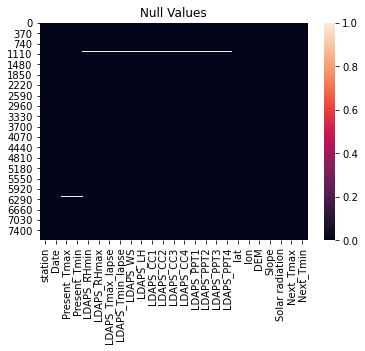

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.heatmap(df.isnull())
plt.title('Null Values')
plt.show()

In [7]:
df.replace(np.NaN,0,inplace=True)

In [8]:
df.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

Null values bieng droped from the data.

# Data Visualisation

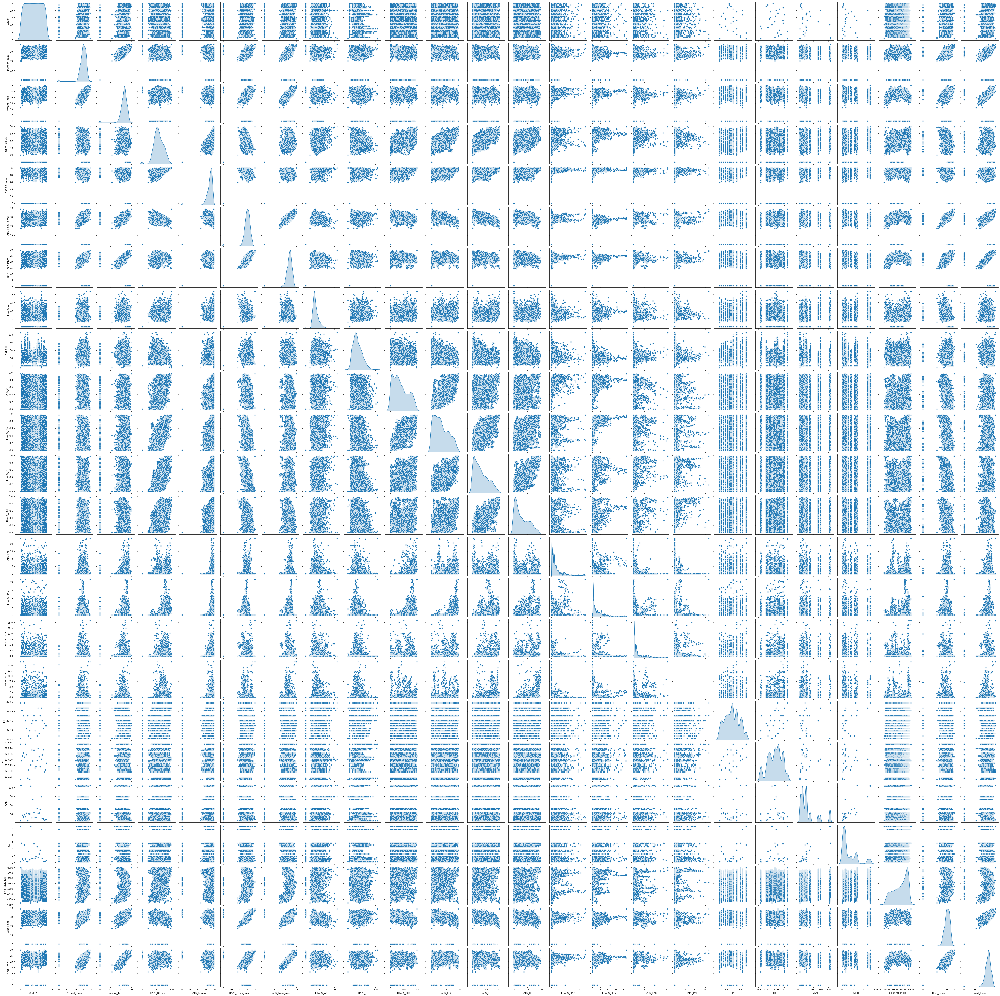

In [30]:
sns.pairplot(df,diag_kind="kde")

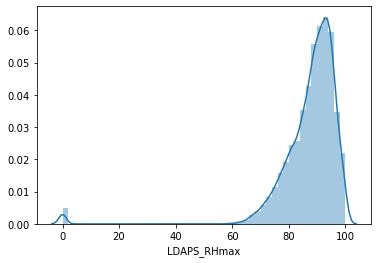

In [31]:
sns.distplot(df.LDAPS_RHmax)

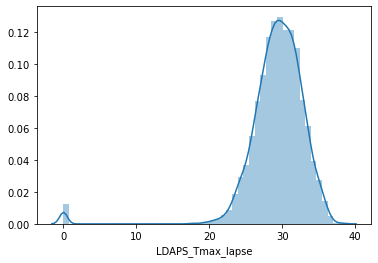

In [32]:
sns.distplot(df.LDAPS_Tmax_lapse)

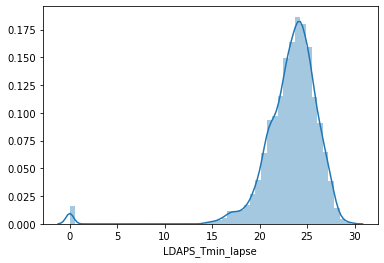

In [33]:
sns.distplot(df.LDAPS_Tmin_lapse)

In [10]:
DFMax= df.drop(['station', 'Date', 'Present_Tmin', 'LDAPS_RHmin','LDAPS_Tmin_lapse','Next_Tmin'], axis=1)

In [11]:
DFMax

,Present_Tmax,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax
0,28.7,91.116364,28.074101,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.000000,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1
1,31.9,90.604721,29.850689,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.000000,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5
2,31.6,83.973587,30.091292,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.000000,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1
3,32.0,96.483688,29.704629,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.000000,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7
4,31.4,90.155128,29.113934,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.000000,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.3,78.869858,26.352081,6.148918,72.058294,0.030034,0.081035,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3
7748,23.3,77.294975,27.010193,6.542819,47.241457,0.035874,0.074962,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6
7749,23.2,77.243744,27.939516,7.289264,9.090034,0.048954,0.059869,0.000000,0.000796,0.000000,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8
7750,20.0,58.936283,17.624954,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4


# Correlation

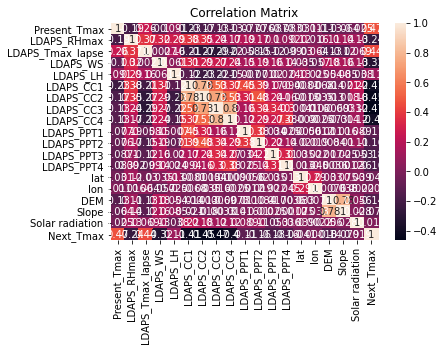

In [12]:
sns.heatmap(DFMax.corr(), annot=True)
plt.title('Correlation Matrix')
plt.show()

In [13]:
corr_matrix=DFMax.corr()
corr_matrix['Next_Tmax'].sort_values(ascending=False)

Next_Tmax           1.000000
Present_Tmax        0.471320
LDAPS_Tmax_lapse    0.440702
LDAPS_LH            0.106437
Solar radiation     0.018649
lon                -0.000184
lat                -0.040905
Slope              -0.078932
LDAPS_PPT1         -0.107681
DEM                -0.140715
LDAPS_PPT4         -0.157285
LDAPS_PPT2         -0.161087
LDAPS_PPT3         -0.178819
LDAPS_RHmax        -0.244316
LDAPS_WS           -0.320432
LDAPS_CC4          -0.400609
LDAPS_CC1          -0.413201
LDAPS_CC2          -0.445854
LDAPS_CC3          -0.465784
Name: Next_Tmax, dtype: float64

Here it's understood how the target, Next_Tmax is correlated with different features. LDAPS_Tmax_lapse bieng highly correlated and LDAPS_CC3  bieng least.

In [14]:
x=DFMax.drop('Next_Tmax', axis =1)
y=DFMax['Next_Tmax']

# Scaling the data using Standard Scaler:

In [15]:
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
Scaled_Data = ss.fit_transform(x)

In [16]:
x

,Present_Tmax,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,28.7,91.116364,28.074101,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.000000,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996
1,31.9,90.604721,29.850689,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.000000,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500
2,31.6,83.973587,30.091292,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.000000,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664
3,32.0,96.483688,29.704629,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.000000,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844
4,31.4,90.155128,29.113934,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.000000,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.3,78.869858,26.352081,6.148918,72.058294,0.030034,0.081035,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965
7748,23.3,77.294975,27.010193,6.542819,47.241457,0.035874,0.074962,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535
7749,23.2,77.243744,27.939516,7.289264,9.090034,0.048954,0.059869,0.000000,0.000796,0.000000,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215
7750,20.0,58.936283,17.624954,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508


# Finding best random state

In [17]:
for i in range(0,100):
    x_train, x_test, y_train, y_test=train_test_split(x, y, test_size=0.1, random_state=i)
    lr.fit(x_train,y_train) 
    pred_train=lr.predict(x_train) 
    pred_test=lr.predict(x_test) 
    print (f"At randon state {i}, the training accuracy is:- {r2_score(y_train, pred_train)}") 
    print (f"At random state {i}, the testing accuracy is:{r2_score(y_test,pred_test)}") 
    print("\n")

At randon state 0, the training accuracy is:- 0.5416904552430762
At random state 0, the testing accuracy is:0.5327155564489623


At randon state 1, the training accuracy is:- 0.5388311185226027
At random state 1, the testing accuracy is:0.5580894420547464


At randon state 2, the training accuracy is:- 0.5446939299726632
At random state 2, the testing accuracy is:0.5026743185985407


At randon state 3, the training accuracy is:- 0.5553735617954338
At random state 3, the testing accuracy is:0.43723455903923925


At randon state 4, the training accuracy is:- 0.5438279881556597
At random state 4, the testing accuracy is:0.5115852676730595


At randon state 5, the training accuracy is:- 0.5312045785242303
At random state 5, the testing accuracy is:0.6394593587091374


At randon state 6, the training accuracy is:- 0.5414737618907719
At random state 6, the testing accuracy is:0.5328993203762724


At randon state 7, the training accuracy is:- 0.5328160975065865
At random state 7, the testing 

At randon state 69, the training accuracy is:- 0.5544094728019577
At random state 69, the testing accuracy is:0.4479420398542897


At randon state 70, the training accuracy is:- 0.5445669620532748
At random state 70, the testing accuracy is:0.5088138025311739


At randon state 71, the training accuracy is:- 0.5296117152093047
At random state 71, the testing accuracy is:0.6683030069265572


At randon state 72, the training accuracy is:- 0.5398715436664259
At random state 72, the testing accuracy is:0.5477234210120834


At randon state 73, the training accuracy is:- 0.5429065518209922
At random state 73, the testing accuracy is:0.5200360955746428


At randon state 74, the training accuracy is:- 0.5417621405270338
At random state 74, the testing accuracy is:0.5299824724423613


At randon state 75, the training accuracy is:- 0.5336887296702439
At random state 75, the testing accuracy is:0.6087938385352671


At randon state 76, the training accuracy is:- 0.5356124506204021
At random state 7

In [18]:
x_train, x_test, y_train, y_test=train_test_split(x, y, test_size=0.1, random_state=99)

In [19]:
lr.fit(x_train, y_train)

LinearRegression()

In [20]:
prd_test=lr.predict(x_test)

In [21]:
print (r2_score(y_test, pred_test))

0.6124772293294689


# Cross-validation of the model

In [22]:
Train_accuracy=r2_score(y_train,pred_train) 
Test_accuracy= r2_score(y_test,pred_test)

In [23]:
from sklearn.model_selection import cross_val_score 
for j in range (2,10):
    cv_score=cross_val_score (lr , x, y, cv=j)
    cv_mean=cv_score.mean()
    print(f" At cross fold {j} the cv score is {cv_mean} and accuracy score for training is {Train_accuracy} and accuracy score for testing is {Test_accuracy}")  
    print("\n")

 At cross fold 2 the cv score is 0.4897446045723686 and accuracy score for training is 0.5340724646416619 and accuracy score for testing is 0.6124772293294689


 At cross fold 3 the cv score is 0.4924124924576252 and accuracy score for training is 0.5340724646416619 and accuracy score for testing is 0.6124772293294689


 At cross fold 4 the cv score is 0.4809726017900787 and accuracy score for training is 0.5340724646416619 and accuracy score for testing is 0.6124772293294689


 At cross fold 5 the cv score is 0.4602068600039759 and accuracy score for training is 0.5340724646416619 and accuracy score for testing is 0.6124772293294689


 At cross fold 6 the cv score is 0.46644658090265345 and accuracy score for training is 0.5340724646416619 and accuracy score for testing is 0.6124772293294689


 At cross fold 7 the cv score is 0.48387675673938535 and accuracy score for training is 0.5340724646416619 and accuracy score for testing is 0.6124772293294689


 At cross fold 8 the cv score is

Since the number of folds don't have such impact on the accuracy and cv_score. So cv=3 is selected.

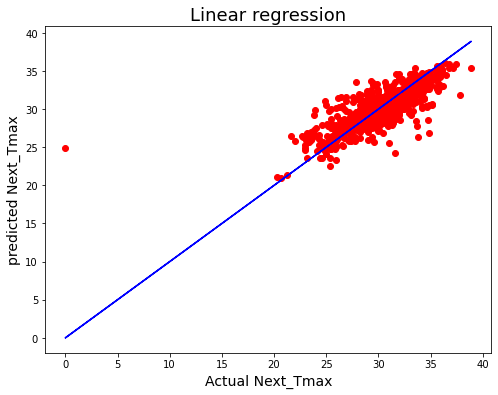

In [24]:
import matplotlib.pyplot as plt 
plt. figure(figsize=(8,6)) 
plt. scatter(x=y_test, y=pred_test, color='r') 
plt.plot(y_test, y_test, color='b') 
plt.xlabel('Actual Next_Tmax', fontsize=14) 
plt.ylabel('predicted Next_Tmax', fontsize=14) 
plt.title('Linear regression', fontsize=18) 
plt.show()

In [26]:
import pickle 
filename = 'TemperaturePrediction.pkl'
pickle.dump(lr, open( filename, 'wb' ))

# Conclusion

In [27]:
loaded_model = pickle.load(open('TemperaturePrediction.pkl', 'rb')) 
result = loaded_model.score(x_test, y_test)

print(result)

0.6124772293294689


In [29]:
conclusion=pd. DataFrame([loaded_model.predict(x_test)[:], pred_test[:]], index=["Predicted", "orginal"])

conclusion

,0,1,2,3,4,5,6,7,8,9,...,766,767,768,769,770,771,772,773,774,775
Predicted,29.329606,26.533827,29.169422,26.660139,27.602399,29.661368,29.961093,29.427461,27.428174,35.44693,...,29.995883,32.641812,25.910263,28.637833,33.110498,33.73329,28.360448,31.069139,25.394395,33.552498
orginal,29.329606,26.533827,29.169422,26.660139,27.602399,29.661368,29.961093,29.427461,27.428174,35.44693,...,29.995883,32.641812,25.910263,28.637833,33.110498,33.73329,28.360448,31.069139,25.394395,33.552498
